In [1]:
!pip install geopandas shapely

In [1]:
import pandas as pd
import geopandas as gpd
from shapely import wkb

# Load the CSV file
#csv_path = '/content/granule_with_dot.csv'  # Update this path after uploading your file
df = pd.read_csv('granule_with_dot.csv')

# Convert WKB geometry in the 'shape' column to shapely geometry
def parse_wkb(hex_string):
    try:
        return wkb.loads(bytes.fromhex(hex_string))
    except Exception as e:
        print(f"Error parsing WKB: {e}")
        return None

# Apply the function to convert hex WKB to geometry
df['geometry'] = df['shape'].apply(parse_wkb)

# Drop any rows where geometry parsing failed
df = df.dropna(subset=['geometry'])

# Convert to a GeoDataFrame for geospatial operations
gdf = gpd.GeoDataFrame(df, geometry='geometry')

# Calculate the area of each geometry
gdf['area'] = gdf['geometry'].area

# Display the calculated areas
gdf[['id', 'area']].head()


Error parsing WKB: non-hexadecimal number found in fromhex() arg at position 32759
Error parsing WKB: fromhex() argument must be str, not float
Error parsing WKB: non-hexadecimal number found in fromhex() arg at position 32759
Error parsing WKB: fromhex() argument must be str, not float
Error parsing WKB: non-hexadecimal number found in fromhex() arg at position 32759
Error parsing WKB: fromhex() argument must be str, not float
Error parsing WKB: non-hexadecimal number found in fromhex() arg at position 32759
Error parsing WKB: fromhex() argument must be str, not float
Error parsing WKB: non-hexadecimal number found in fromhex() arg at position 32759
Error parsing WKB: fromhex() argument must be str, not float
Error parsing WKB: non-hexadecimal number found in fromhex() arg at position 32759
Error parsing WKB: fromhex() argument must be str, not float
Error parsing WKB: non-hexadecimal number found in fromhex() arg at position 32759
Error parsing WKB: fromhex() argument must be str, no

,id,area
0,1,335.0
1,2,20.0
2,3,7270.0
3,4,587.0
4,5,16.0


gdf.head(10)


In [11]:
#VISUALISING TEH AREA DISTRIBUTION 

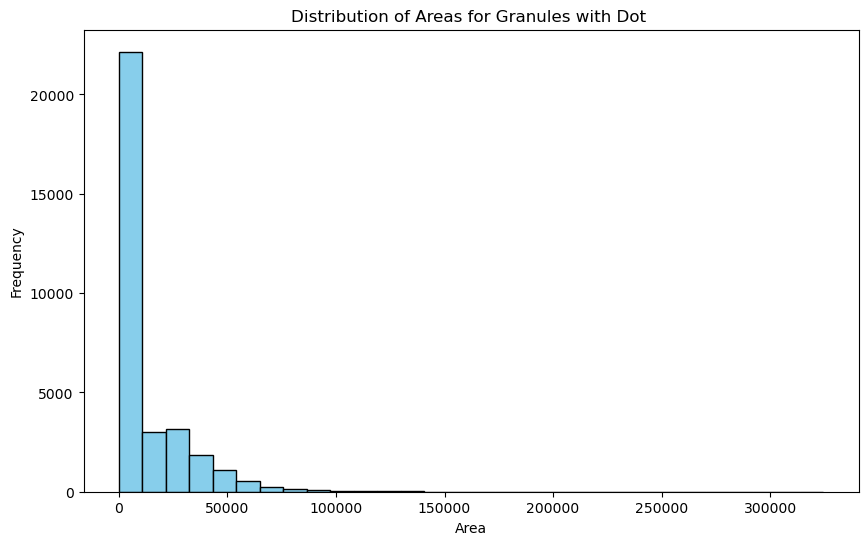

In [25]:
import matplotlib.pyplot as plt

# Plot a histogram of the area distribution
plt.figure(figsize=(10, 6))
plt.hist(gdf['area'], bins=30, color='skyblue', edgecolor='black')
plt.title("Distribution of Areas for Granules with Dot ")
plt.xlabel("Area")
plt.ylabel("Frequency")
plt.savefig("histogram_granules_dot.png")
plt.show()


In [9]:
# Check skewness
print(gdf['area'].skew())

3.754286054445201


In [7]:
gdf1=gdf.copy()

In [9]:
gdf1=gdf[gdf['area'] <= 70000]


In [11]:
gdf1.shape

(31966, 5)

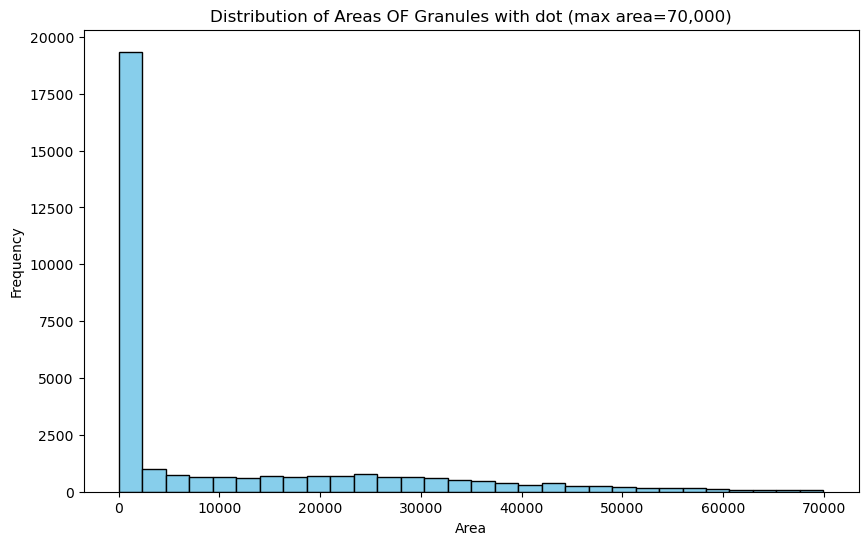

In [51]:
# Plot a histogram of the area distribution
plt.figure(figsize=(10, 6))
plt.hist(gdf1['area'], bins=30, color='skyblue', edgecolor='black')
plt.title("Distribution of Areas OF Granules with dot (max area=70,000)")
plt.xlabel("Area")
plt.ylabel("Frequency")
plt.show()

In [19]:
gdf2=gdf[gdf['area'] >= 10000]

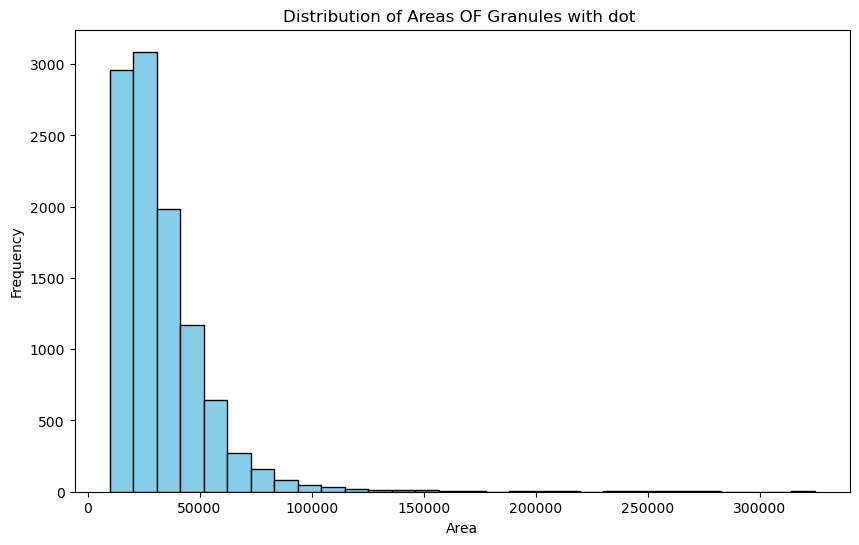

In [21]:
# Plot a histogram of the area distribution
plt.figure(figsize=(10, 6))
plt.hist(gdf2['area'], bins=30, color='skyblue', edgecolor='black')
plt.title("Distribution of Areas OF Granules with dot ")
plt.xlabel("Area")
plt.ylabel("Frequency")
plt.show()

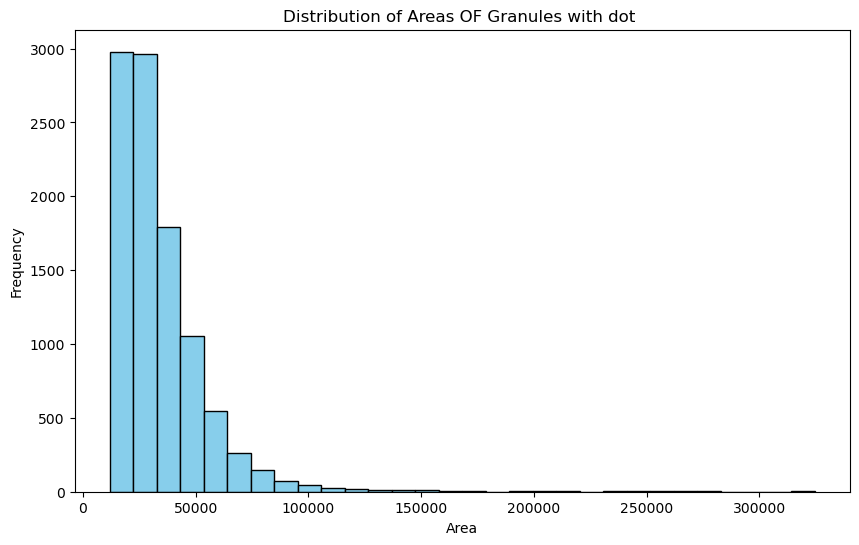

In [37]:
gdf3=gdf[gdf['area'] >= 12000]
# Plot a histogram of the area distribution
plt.figure(figsize=(10, 6))
plt.hist(gdf3['area'], bins=30, color='skyblue', edgecolor='black')
plt.title("Distribution of Areas OF Granules with dot ")
plt.xlabel("Area")
plt.ylabel("Frequency")
plt.show()

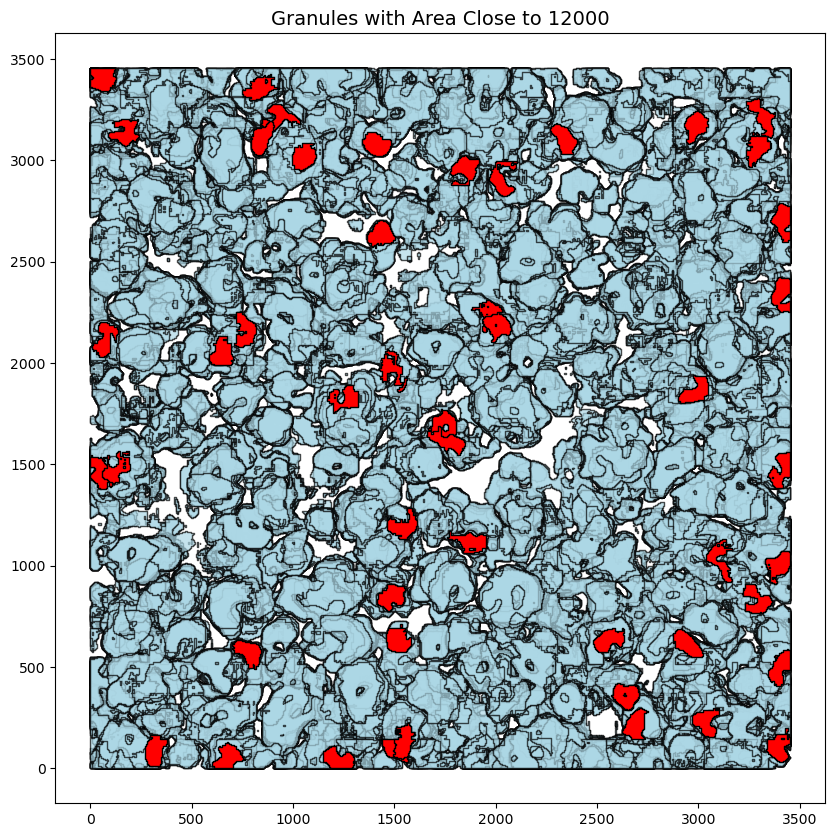

In [53]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Specify the target area you want to look for
target_area = 12000  # You can set this to any value you're interested in

# Filter the granules with area near the target value
# You can modify the range depending on how close the granules' areas should be to the target area
target_granules = gdf[(gdf['area'] >= target_area - 100) & (gdf['area'] <= target_area + 100)]  # Adjust the range as needed

# Plot the granules
fig, ax = plt.subplots(figsize=(10, 10))

# Plot all the granules in light blue
gdf.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.7)

# Highlight the granules with the specified target area in red
target_granules.plot(ax=ax, color='red', edgecolor='black', alpha=1.0)

# Add a title
plt.title(f"Granules with Area Close to {target_area}", fontsize=14)

# Show the plot
plt.show()
#plt.savefig("larestarea.png")

<Figure size 1000x1000 with 0 Axes>

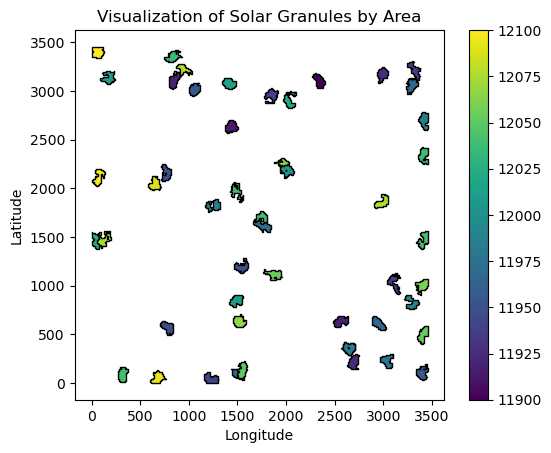

In [55]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Plotting the geometries (granules)
plt.figure(figsize=(10, 10))
target_granules.plot(column='area', cmap='viridis', legend=True, edgecolor='black')
plt.title("Visualization of Solar Granules by Area")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

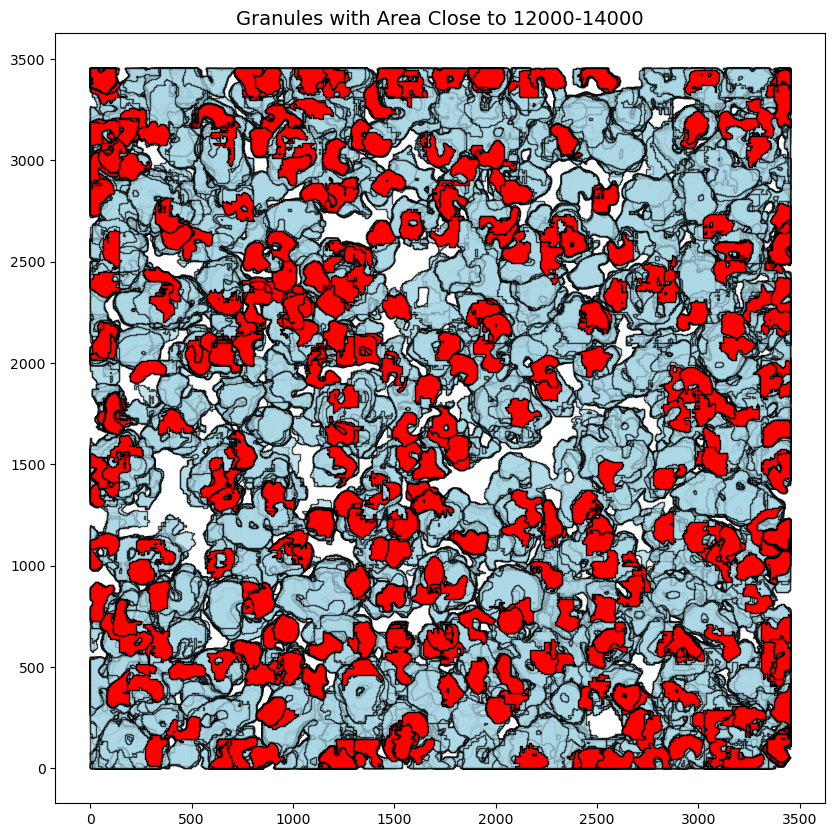

In [57]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Specify the target area you want to look for
target_area = 12000  # You can set this to any value you're interested in

# Filter the granules with area near the target value
# You can modify the range depending on how close the granules' areas should be to the target area
target_granules = gdf[(gdf['area'] >= target_area - 100) & (gdf['area'] <= target_area + 2000)]  # Adjust the range as needed

# Plot the granules
fig, ax = plt.subplots(figsize=(10, 10))

# Plot all the granules in light blue
gdf3.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.7)

# Highlight the granules with the specified target area in red
target_granules.plot(ax=ax, color='red', edgecolor='black', alpha=1.0)

# Add a title
plt.title(f"Granules with Area Close to 12000-14000", fontsize=14)

# Show the plot
plt.show()
#plt.savefig("larestarea.png")

In [59]:
gdf_clean=gdf[gdf['area'] >= 12000]

In [63]:
gdf.shape


(32443, 5)

In [65]:
gdf_clean.shape

(9984, 5)

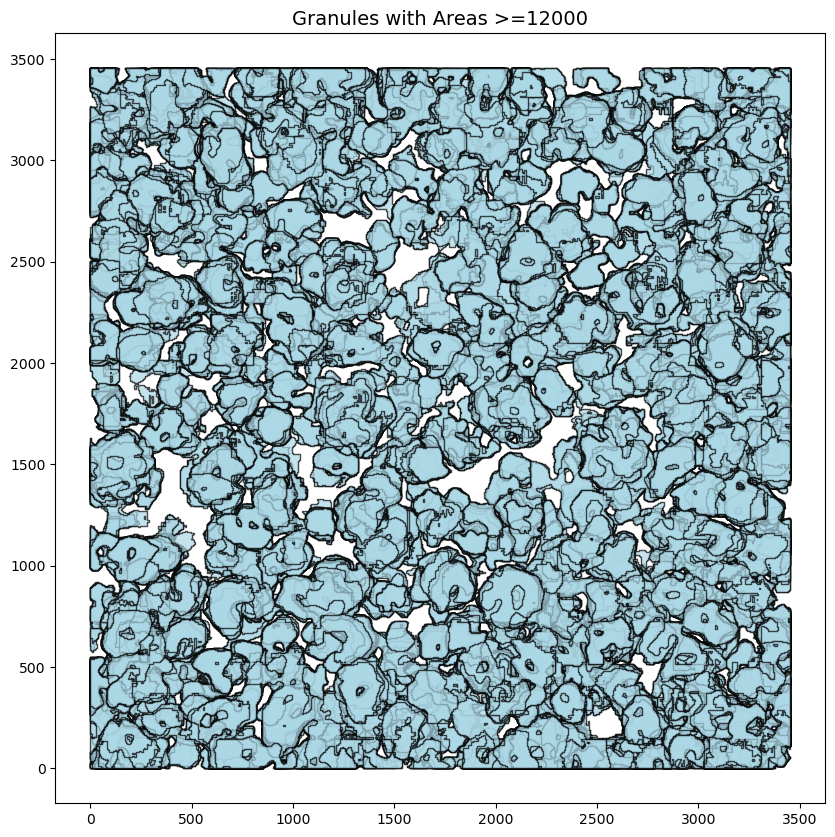

<Figure size 640x480 with 0 Axes>

In [83]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming gdf is your GeoDataFrame
#gdf['area'] = gdf.geometry.area  # Compute the area of each geometry

# Plotting the geometries
fig, ax = plt.subplots(figsize=(10, 10))

# Plot all the granules in light blue
gdf_clean.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.7)

# Highlight the geometries with different colors based on the area
#gdf_clean.plot(ax=ax, column='area', cmap='viridis', legend=True, edgecolor='black', alpha=0.7)

# Add a title
plt.title("Granules with Areas >=12000", fontsize=14)

# Show the plot
plt.show()
plt.savefig("cleaned_dot.png")

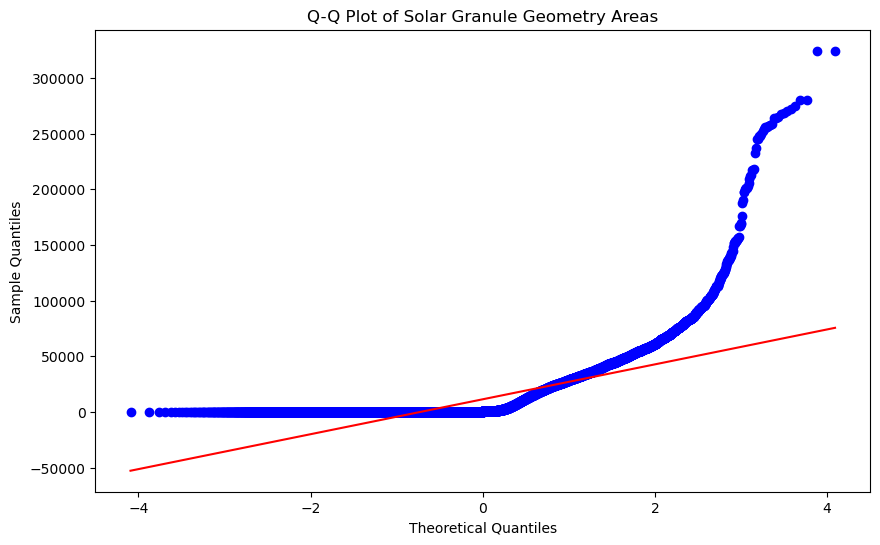

In [11]:
#CHECKING FOR NORMAL DISTRIBUTION USING Q-Q PLOT

import matplotlib.pyplot as plt
import scipy.stats as stats

# Q-Q plot to check normality
plt.figure(figsize=(10, 6))
stats.probplot(gdf['area'], dist="norm", plot=plt)
plt.title("Q-Q Plot of Solar Granule Geometry Areas")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Sample Quantiles")
plt.show()

In [13]:
print("Minimum Area:", gdf['area'].min())
print("Maximum Area:",gdf['area'].max())

Minimum Area: 16.0
Maximum Area: 324486.0


In [15]:
# Calculate the 10th percentile of the area
threshold = gdf['area'].quantile(0.10)  # 10th percentile

# Filter granules smaller than this threshold
small_granules = gdf[gdf['area'] < threshold]
print(small_granules.shape)
print(small_granules[['id', 'area']])

(1347, 5)
          id  area
4          5  16.0
31        32  16.0
72        73  16.0
104      105  16.0
116      117  16.0
...      ...   ...
32380  32353  16.0
32394  32367  16.0
32403  32376  16.0
32405  32378  16.0
32411  32384  16.0

[1347 rows x 2 columns]


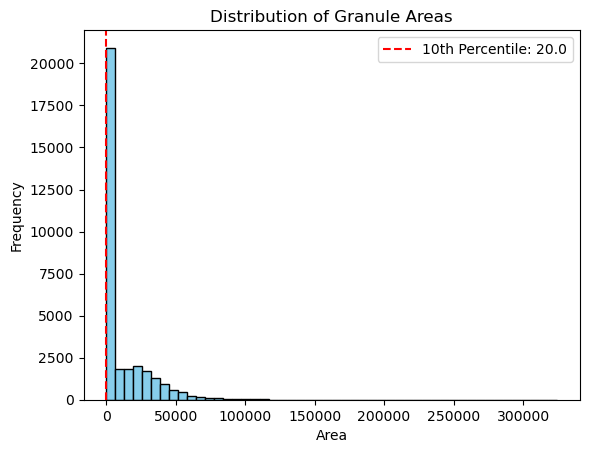

In [27]:
import matplotlib.pyplot as plt

# Plot a histogram to see the distribution of areas
plt.hist(gdf['area'], bins=50, color='skyblue', edgecolor='black')
plt.axvline(x=threshold, color='red', linestyle='--', label=f"10th Percentile: {threshold}")
plt.title("Distribution of Granule Areas")
plt.xlabel("Area")
plt.ylabel("Frequency")
plt.legend()
plt.show()


In [29]:
# Calculate the 10th percentile of the area
threshold2 = gdf['area'].quantile(0.25)  # 25th percentile

# Filter granules smaller than this threshold
small_granules2 = gdf[gdf['area'] < threshold]
print(small_granules2.shape)
print(small_granules2[['id', 'area']])

(1347, 5)
          id  area
4          5  16.0
31        32  16.0
72        73  16.0
104      105  16.0
116      117  16.0
...      ...   ...
32380  32353  16.0
32394  32367  16.0
32403  32376  16.0
32405  32378  16.0
32411  32384  16.0

[1347 rows x 2 columns]


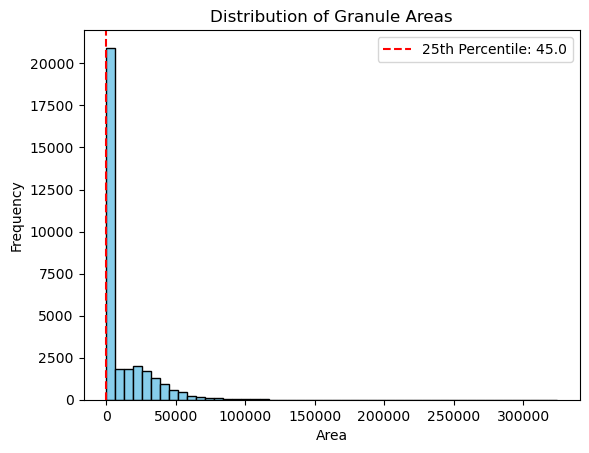

In [31]:
import matplotlib.pyplot as plt

# Plot a histogram to see the distribution of areas
plt.hist(gdf['area'], bins=50, color='skyblue', edgecolor='black')
plt.axvline(x=threshold, color='red', linestyle='--', label=f"25th Percentile: {threshold2}")
plt.title("Distribution of Granule Areas")
plt.xlabel("Area")
plt.ylabel("Frequency")
plt.legend()
plt.show()


In [35]:
# Calculate the 10th percentile of the area
threshold3 = gdf['area'].quantile(0.90)  # 10th percentile

# Filter granules smaller than this threshold
small_granules3 = gdf[gdf['area'] < threshold]
print(small_granules3.shape)
print(small_granules3[['id', 'area']])

(1347, 5)
          id  area
4          5  16.0
31        32  16.0
72        73  16.0
104      105  16.0
116      117  16.0
...      ...   ...
32380  32353  16.0
32394  32367  16.0
32403  32376  16.0
32405  32378  16.0
32411  32384  16.0

[1347 rows x 2 columns]


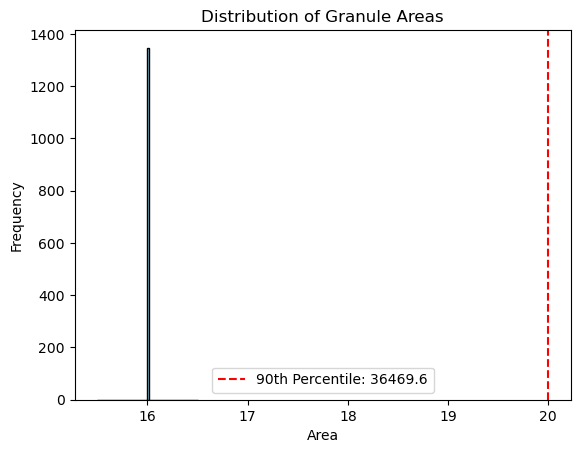

In [37]:
import matplotlib.pyplot as plt

# Plot a histogram to see the distribution of areas
plt.hist(small_granules3['area'], bins=50, color='skyblue', edgecolor='black')
plt.axvline(x=threshold, color='red', linestyle='--', label=f"90th Percentile: {threshold3}")
plt.title("Distribution of Granule Areas")
plt.xlabel("Area")
plt.ylabel("Frequency")
plt.legend()
plt.show()

<Figure size 1000x1000 with 0 Axes>

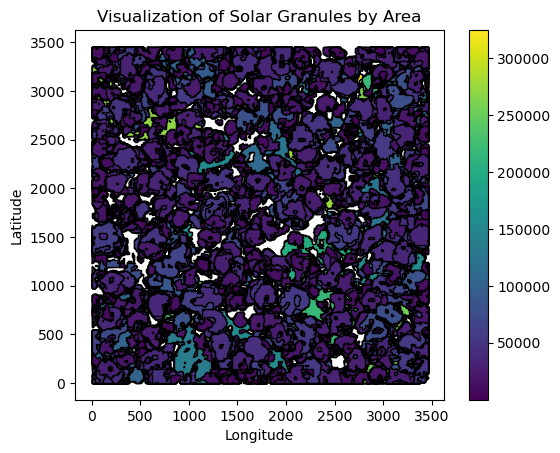

In [39]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Plotting the geometries (granules)
plt.figure(figsize=(10, 10))
gdf.plot(column='area', cmap='viridis', legend=True, edgecolor='black')
plt.title("Visualization of Solar Granules by Area")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


In [41]:
##Analyzing correct classifications using approximate area thresholds

In [43]:
gdf['class']=1
gdf.head(10)

,id,time,shape,geometry,area,class
0,1,46:29.3,0103000020E6100000010000000B00000000000000000C...,"POLYGON ((2438 9, 2438 22, 2447 22, 2447 27, 2...",335.0,1
1,2,46:29.3,0103000020E610000001000000050000000000000000F0...,"POLYGON ((2424 45, 2424 49, 2429 49, 2429 45, ...",20.0,1
2,3,46:29.3,0103000020E610000001000000350000000000000000D8...,"POLYGON ((571 0, 571 4, 567 4, 567 18, 562 18,...",7270.0,1
3,4,46:29.3,0103000020E6100000010000000F00000000000000000C...,"POLYGON ((2438 27, 2438 45, 2433 45, 2433 54, ...",587.0,1
4,5,46:29.3,0103000020E61000000100000005000000000000000018...,"POLYGON ((675 72, 675 76, 679 76, 679 72, 675 ...",16.0,1
5,6,46:29.3,0103000020E61000000100000005000000000000000040...,"POLYGON ((648 72, 648 81, 657 81, 657 72, 648 ...",81.0,1
6,7,46:29.3,0103000020E6100000010000002300000000000000001A...,"POLYGON ((2573 22, 2573 40, 2568 40, 2568 45, ...",2394.0,1
7,8,46:29.3,0103000020E61000000100000005000000000000000060...,"POLYGON ((139 112, 139 117, 144 117, 144 112, ...",25.0,1
8,9,46:29.3,0103000020E61000000100000029000000000000000070...,"POLYGON ((1628 72, 1628 76, 1624 76, 1624 81, ...",8124.0,1
9,10,46:29.3,0103000020E61000000100000005000000000000000060...,"POLYGON ((2096 148, 2096 153, 2100 153, 2100 1...",20.0,1


Median Area: 369.0


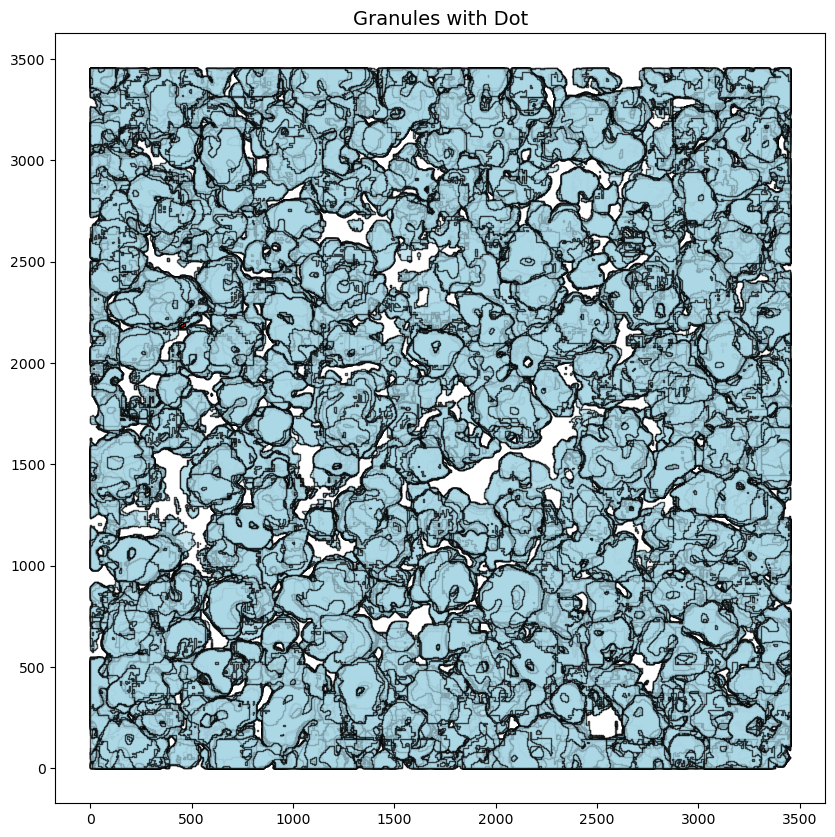

In [21]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Calculate the median area value
median_area = gdf['area'].median()
print(f"Median Area: {median_area}")

# Identify the granule(s) that are closest to the median area
# Optionally, you can choose the granule(s) that exactly match the median area or the one closest to it
median_granule = gdf.iloc[(gdf['area'] - median_area).abs().argsort()[:1]]

# Plot the granules
fig, ax = plt.subplots(figsize=(10, 10))

# Plot all the granules in blue
gdf.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.7)

# Highlight the granule(s) closest to the median in red
median_granule.plot(ax=ax, color='red', edgecolor='black', alpha=1.0)

# Add a title
plt.title(f"Granules with Dot", fontsize=14)
plt.savefig("originaldot.png")
# Show the plot
plt.show()
#plt.savefig("originaldot.png")

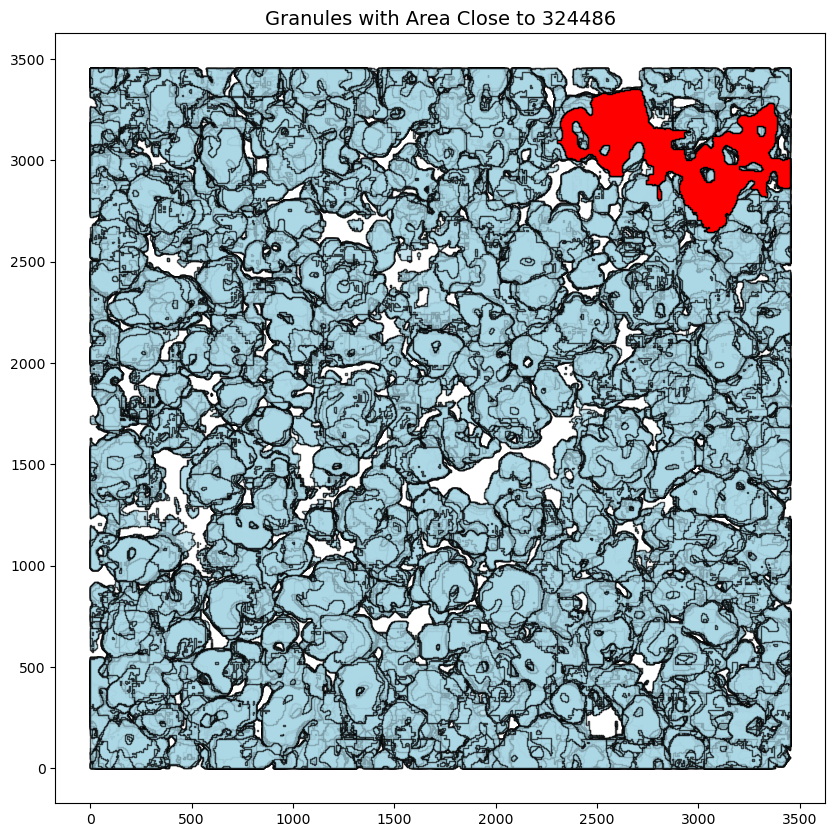

<Figure size 640x480 with 0 Axes>

In [23]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Specify the target area you want to look for
target_area = 324486  # You can set this to any value you're interested in

# Filter the granules with area near the target value
# You can modify the range depending on how close the granules' areas should be to the target area
target_granules = gdf[(gdf['area'] >= target_area - 100) & (gdf['area'] <= target_area + 100)]  # Adjust the range as needed

# Plot the granules
fig, ax = plt.subplots(figsize=(10, 10))

# Plot all the granules in light blue
gdf.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.7)

# Highlight the granules with the specified target area in red
target_granules.plot(ax=ax, color='red', edgecolor='black', alpha=1.0)

# Add a title
plt.title(f"Granules with Area Close to {target_area}", fontsize=14)

# Show the plot
plt.show()
plt.savefig("larestarea.png")

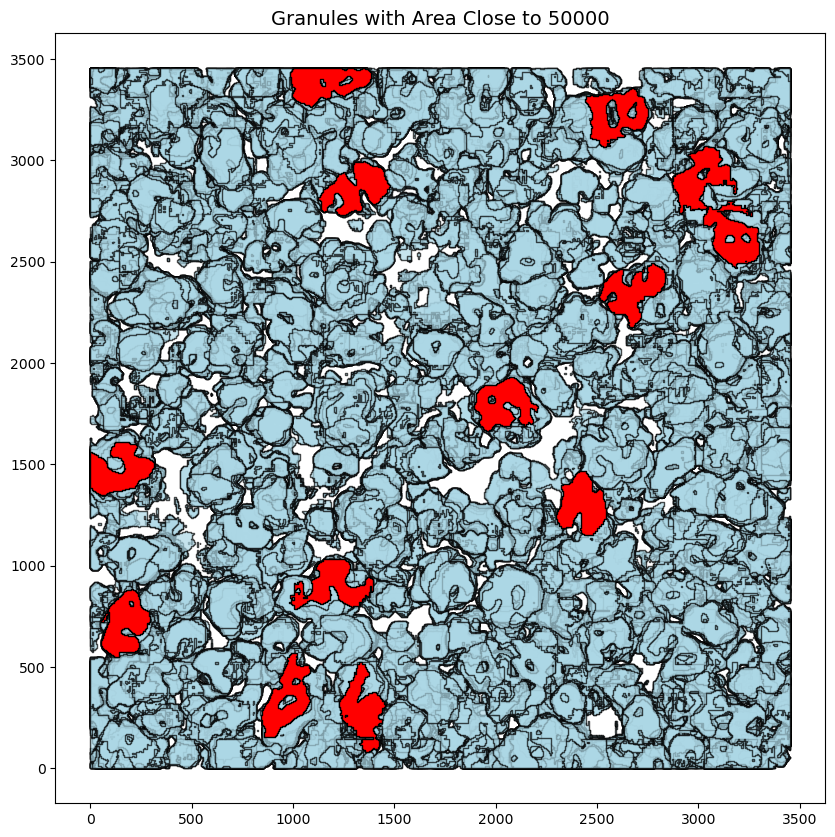

In [49]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Specify the target area you want to look for
target_area = 50000  # You can set this to any value you're interested in

# Filter the granules with area near the target value
# You can modify the range depending on how close the granules' areas should be to the target area
target_granules = gdf[(gdf['area'] >= target_area - 100) & (gdf['area'] <= target_area + 100)]  # Adjust the range as needed

# Plot the granules
fig, ax = plt.subplots(figsize=(10, 10))

# Plot all the granules in light blue
gdf.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.7)

# Highlight the granules with the specified target area in red
target_granules.plot(ax=ax, color='red', edgecolor='black', alpha=1.0)

# Add a title
plt.title(f"Granules with Area Close to {target_area}", fontsize=14)

# Show the plot
plt.show()


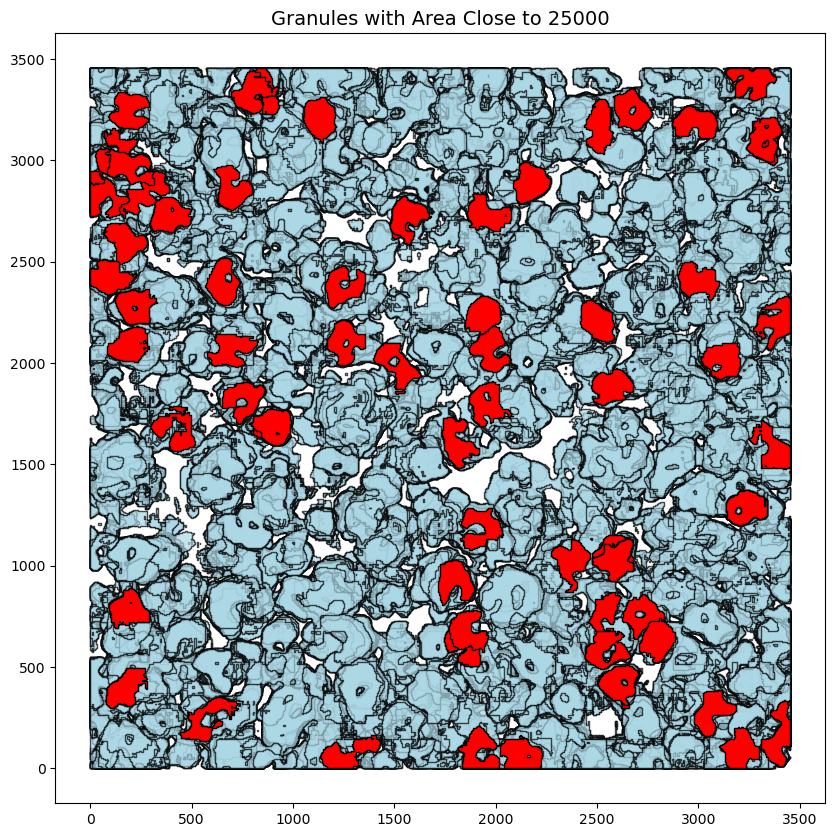

In [51]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Specify the target area you want to look for
target_area = 25000  # You can set this to any value you're interested in

# Filter the granules with area near the target value
# You can modify the range depending on how close the granules' areas should be to the target area
target_granules = gdf[(gdf['area'] >= target_area - 100) & (gdf['area'] <= target_area + 100)]  # Adjust the range as needed

# Plot the granules
fig, ax = plt.subplots(figsize=(10, 10))

# Plot all the granules in light blue
gdf.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.7)

# Highlight the granules with the specified target area in red
target_granules.plot(ax=ax, color='red', edgecolor='black', alpha=1.0)

# Add a title
plt.title(f"Granules with Area Close to {target_area}", fontsize=14)

# Show the plot
plt.show()

In [53]:
# Filter the granules with area less than 25000
granules_below_25000 = gdf[gdf['area'] < 25000]

# Count the number of data points that have area less than 25000
num_below_25000 = granules_below_25000.shape[0]

# Print the result
print(f"Number of granules with area less than 25000: {num_below_25000}")
percenteage_missclassified=(num_below_25000/gdf.shape[0])*100
print(percenteage_missclassified)

Number of granules with area less than 25000: 26232
80.8556545325648


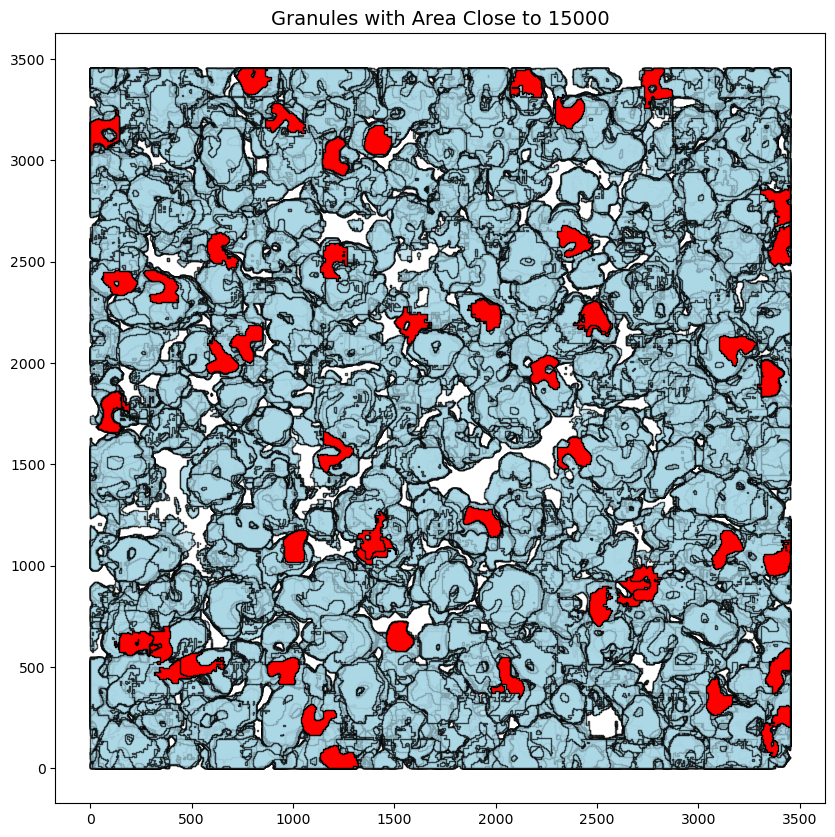

In [55]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Specify the target area you want to look for
target_area = 15000  # You can set this to any value you're interested in

# Filter the granules with area near the target value
# You can modify the range depending on how close the granules' areas should be to the target area
target_granules = gdf[(gdf['area'] >= target_area - 100) & (gdf['area'] <= target_area + 100)]  # Adjust the range as needed

# Plot the granules
fig, ax = plt.subplots(figsize=(10, 10))

# Plot all the granules in light blue
gdf.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.7)

# Highlight the granules with the specified target area in red
target_granules.plot(ax=ax, color='red', edgecolor='black', alpha=1.0)

# Add a title
plt.title(f"Granules with Area Close to {target_area}", fontsize=14)

# Show the plot
plt.show()

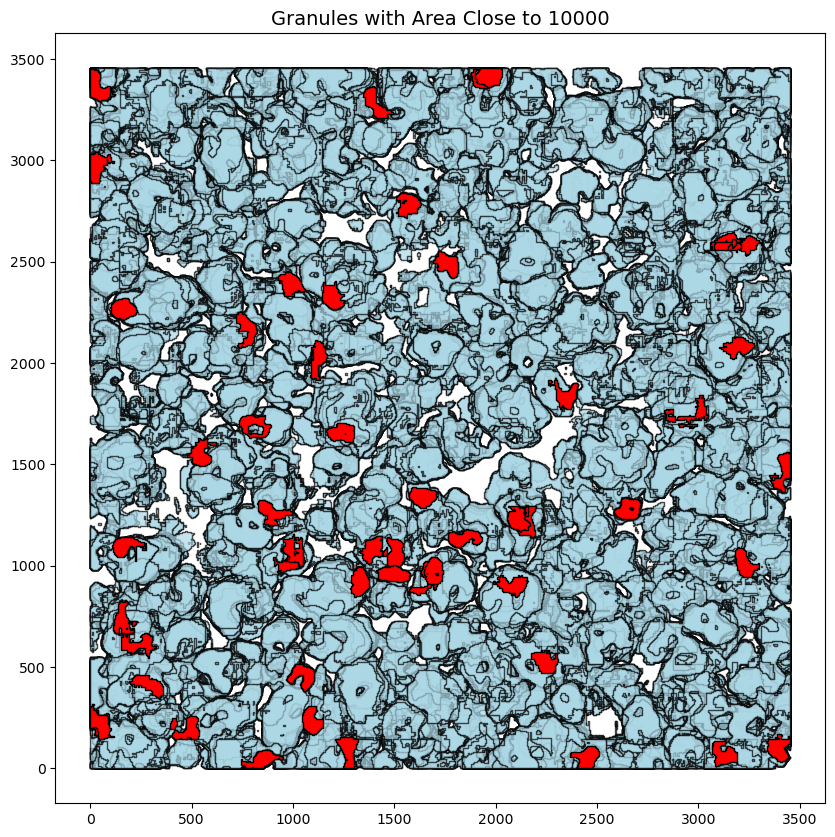

In [57]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Specify the target area you want to look for
target_area = 10000  # You can set this to any value you're interested in

# Filter the granules with area near the target value
# You can modify the range depending on how close the granules' areas should be to the target area
target_granules = gdf[(gdf['area'] >= target_area - 100) & (gdf['area'] <= target_area + 100)]  # Adjust the range as needed

# Plot the granules
fig, ax = plt.subplots(figsize=(10, 10))

# Plot all the granules in light blue
gdf.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.7)

# Highlight the granules with the specified target area in red
target_granules.plot(ax=ax, color='red', edgecolor='black', alpha=1.0)

# Add a title
plt.title(f"Granules with Area Close to {target_area}", fontsize=14)

# Show the plot
plt.show()


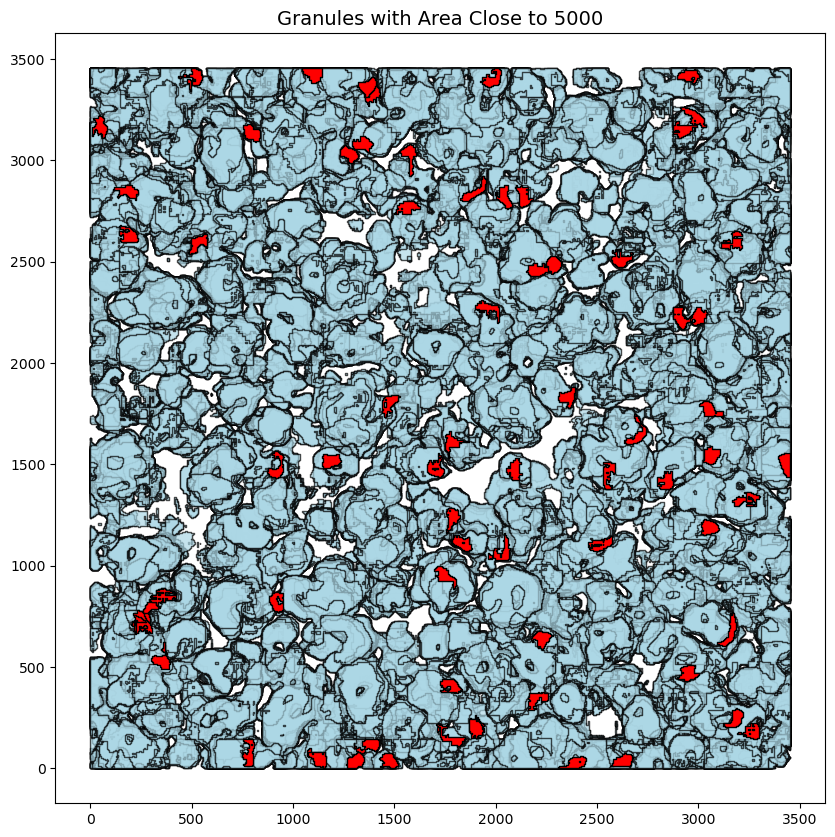

In [59]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Specify the target area you want to look for
target_area = 5000  # You can set this to any value you're interested in

# Filter the granules with area near the target value
# You can modify the range depending on how close the granules' areas should be to the target area
target_granules = gdf[(gdf['area'] >= target_area - 100) & (gdf['area'] <= target_area + 100)]  # Adjust the range as needed

# Plot the granules
fig, ax = plt.subplots(figsize=(10, 10))

# Plot all the granules in light blue
gdf.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.7)

# Highlight the granules with the specified target area in red
target_granules.plot(ax=ax, color='red', edgecolor='black', alpha=1.0)

# Add a title
plt.title(f"Granules with Area Close to {target_area}", fontsize=14)

# Show the plot
plt.show()


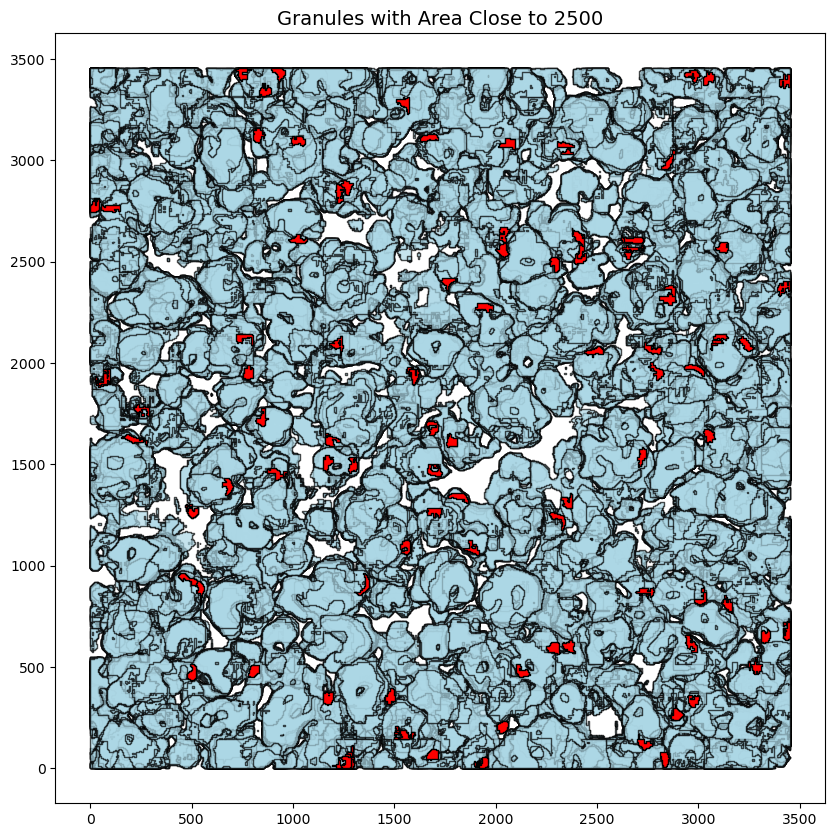

In [61]:
import matplotlib.pyplot as plt
import geopandas as gpd

# Specify the target area you want to look for
target_area = 2500  # You can set this to any value you're interested in

# Filter the granules with area near the target value
# You can modify the range depending on how close the granules' areas should be to the target area
target_granules = gdf[(gdf['area'] >= target_area - 100) & (gdf['area'] <= target_area + 100)]  # Adjust the range as needed

# Plot the granules
fig, ax = plt.subplots(figsize=(10, 10))

# Plot all the granules in light blue
gdf.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.7)

# Highlight the granules with the specified target area in red
target_granules.plot(ax=ax, color='red', edgecolor='black', alpha=1.0)

# Add a title
plt.title(f"Granules with Area Close to {target_area}", fontsize=14)

# Show the plot
plt.show()

In [63]:
##Taking lower threshold area as 15000 and filtering granules less than lower threshold area

In [65]:
# Filter the granules with area less than 25000
granules_below_15000 = gdf[gdf['area'] < 15000]

# Count the number of data points that have area less than 15000
num_below_15000 = granules_below_15000.shape[0]

# Print the result
print(f"Number of granules with area less than 15000: {num_below_15000}")
percenteage_missclassified=(num_below_15000/gdf.shape[0])*100
print(percenteage_missclassified)

Number of granules with area less than 15000: 23280
71.75661930154425


In [5]:
# Set the lower threshold area
lower_threshold_area = 12000

# Filter granules with area less than the lower threshold
incorrect_classifications = gdf[gdf['area'] < lower_threshold_area]
correct_classifications = gdf[gdf['area'] >= lower_threshold_area]


In [7]:
# Save DataFrame to CSV file
correct_classifications.to_csv("correct_classification_granules_with_dot_12k.csv", index=False)


/var/folders/n6/84zcjhrx5wv074q1z71nmb540000gn/T/ipykernel_24655/975794043.py:28: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend(loc="upper right")
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


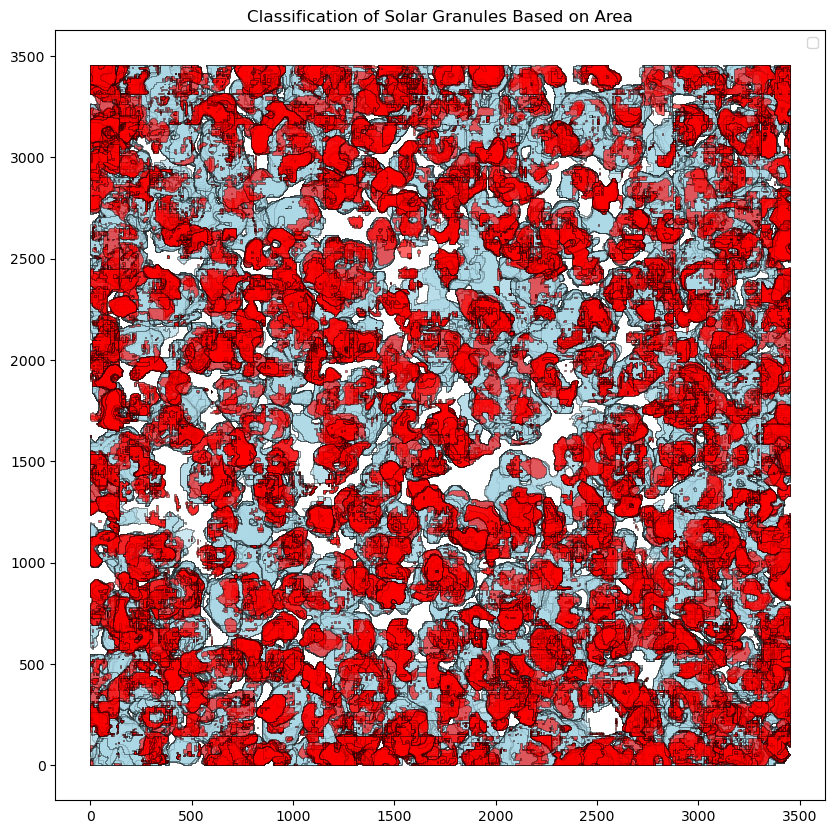

In [71]:
import matplotlib.pyplot as plt

# Plot with edges and transparency
fig, ax = plt.subplots(figsize=(10, 10))

# Plot correct classifications in blue with black edges
correct_classifications.plot(
    ax=ax,
    color="lightblue",
    edgecolor="black",
    linewidth=0.5,
    alpha=0.6,
    label="Correct Classification"
)

# Plot incorrect classifications in red with black edges
incorrect_classifications.plot(
    ax=ax,
    color="red",
    edgecolor="black",
    linewidth=0.5,
    alpha=0.6,
    label="Incorrect Classification"
)

# Add title and legend
plt.title("Classification of Solar Granules Based on Area")
plt.legend(loc="upper right")

plt.show()


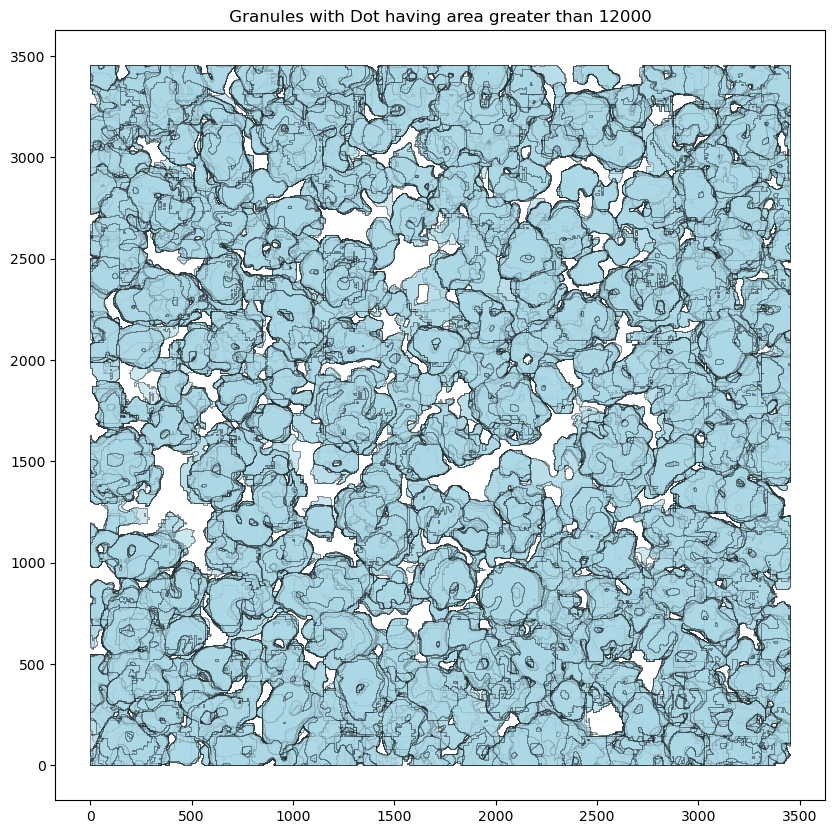

In [23]:
import matplotlib.pyplot as plt

# Plot with edges and transparency
fig, ax = plt.subplots(figsize=(10, 10))

correct_classifications.plot(
    ax=ax,
    color="lightblue",
    edgecolor="black",
    linewidth=0.5,
    alpha=0.6,
    label="Correct Classification"
)
plt.title(" Granules with Dot having area greater than 12000 ")
plt.savefig("Solar Granules having area greater than 12000_gwd.png")
plt.show()
#plt.savefig("Solar Granules having area greater than 12000_gwd.png")

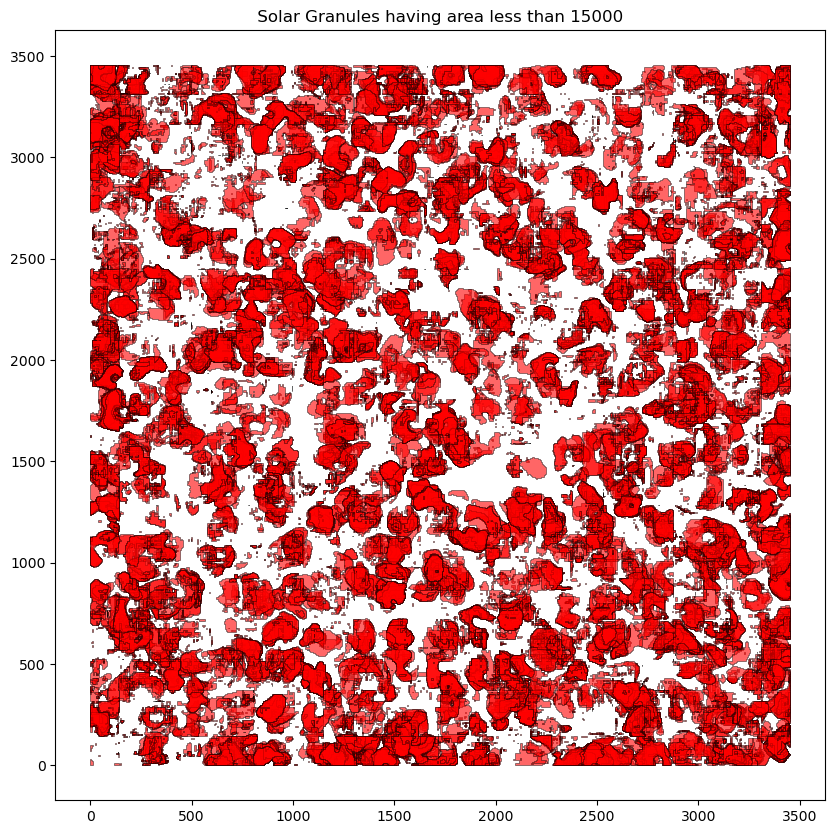

In [75]:
import matplotlib.pyplot as plt

# Plot with edges and transparency
fig, ax = plt.subplots(figsize=(10, 10))

incorrect_classifications.plot(
    ax=ax,
    color="red",
    edgecolor="black",
    linewidth=0.5,
    alpha=0.6,
    label="Incorrect Classification"
)

plt.title(" Solar Granules having area less than 15000 ")
plt.show()